# 1. Clustering
Loose idea: rides will be clustered based on distance, time, and membership status.

In [1]:
using DataFrames, Plots, Dates, Clustering, Distances Statistics;
import CSV;
Plots.default(show = true)
Base.deg2rad(::Missing) = missing
Base.sin(::Vector{Union{Missing, Float64}}) = missing
Base.cos(::Vector{Float64}) = missing
Base.cos(::Vector{Union{Missing, Float64}}) = missing


In [2]:
filepath = "jc_data.csv"

df = CSV.read(filepath, DataFrame)

Row,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
,String31,String15,String31,String31,String?,String7?,String?,String7?,Float64,Float64,Float64?,Float64?,String7
1,0905B18B365C9D20,classic_bike,2023-01-28 09:18:10,2023-01-28 09:28:52,Hoboken Terminal - Hudson St & Hudson Pl,HB101,Hamilton Park,JC009,40.7359,-74.0303,40.7276,-74.0442,member
2,B4F0562B05CB5404,electric_bike,2023-01-23 20:10:12,2023-01-23 20:18:27,Hoboken Terminal - Hudson St & Hudson Pl,HB101,Southwest Park - Jackson St & Observer Hwy,HB401,40.7359,-74.0303,40.7376,-74.0417,member
3,5ABF032895F5D87E,classic_bike,2023-01-29 15:27:04,2023-01-29 15:32:38,Hoboken Terminal - Hudson St & Hudson Pl,HB101,Marshall St & 2 St,HB408,40.7359,-74.0304,40.7408,-74.0425,member
4,E7E1F9C53976D2F9,classic_bike,2023-01-24 18:35:08,2023-01-24 18:42:13,Hoboken Terminal - Hudson St & Hudson Pl,HB101,Hamilton Park,JC009,40.736,-74.0304,40.7276,-74.0442,member
5,323165780CA0734B,classic_bike,2023-01-21 20:44:09,2023-01-21 20:48:08,Hamilton Park,JC009,Manila & 1st,JC082,40.7276,-74.0442,40.7217,-74.0429,member
6,8B09969A4891D5F9,classic_bike,2023-01-18 08:11:38,2023-01-18 08:15:30,Hamilton Park,JC009,Manila & 1st,JC082,40.7276,-74.0442,40.7217,-74.0429,member
7,E8925D3061287322,electric_bike,2023-01-26 08:38:32,2023-01-26 08:45:09,Hamilton Park,JC009,Marshall St & 2 St,HB408,40.7276,-74.0442,40.7408,-74.0425,member
8,5AB1C193D3F6D12E,classic_bike,2023-01-22 12:36:31,2023-01-22 12:57:41,Hoboken Terminal - Hudson St & Hudson Pl,HB101,Marin Light Rail,JC013,40.7359,-74.0303,40.7146,-74.0428,member
9,65F9E37F8E28A6B2,classic_bike,2023-01-18 20:45:17,2023-01-18 20:52:18,Journal Square,JC103,Christ Hospital,JC034,40.7337,-74.0625,40.7348,-74.0504,member


In [3]:
# baseline cleaning/transform: create datetimes 
df = transform(df, :ended_at => (t -> DateTime.(t, "yyy-mm-dd HH:MM:SS.s")) => :ended_at)
df = transform(df, :ended_at => (t -> Date.(t)) => :ended_at_date)
df.started_at = DateTime.(df.started_at, dateformat"y-m-d H:M:S.s")

# calculate haversine distance in m
transform!(df, [:start_lat, :start_lng, :end_lat, :end_lng] => ByRow((a, b, c, d) -> haversine((a, b), (c, d))) => :distance_m)

# calculate time elapsed in seconds
transform!(df, [:ended_at, :started_at] => ByRow((a, b) -> (a .- b).value / 1000 ) => :time_elapsed_s)

1986469-element Vector{DateTime}:
 2023-01-28T09:18:10
 2023-01-23T20:10:12
 2023-01-29T15:27:04
 2023-01-24T18:35:08
 2023-01-21T20:44:09
 2023-01-18T08:11:38
 2023-01-26T08:38:32
 2023-01-22T12:36:31
 2023-01-18T20:45:17
 2023-01-17T13:45:17
 ⋮
 2024-11-06T14:53:38.277
 2024-11-05T20:09:55.864
 2024-11-12T20:18:29.020
 2024-11-22T14:53:33.683
 2024-11-16T08:59:39.259
 2024-11-01T11:21:09.369
 2024-11-05T09:22:25.580
 2024-11-16T09:11:00.690
 2024-11-12T15:56:16.003

In [6]:
df = dropmissing(df)
df_nonzero = df[df.distance_m .> 100, :] # limit to when distance > 100m (e.g. not just a round trip)
df_nonzero = df_nonzero[df_nonzero.time_elapsed_s .< 45*60, :] # limit to when rides are less than 45 minutes

Row,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,ended_at_date,distance_m,time_elapsed_s
,String31,String15,DateTime,DateTime,String,String7,String,String7,Float64,Float64,Float64,Float64,String7,Date,Float64,Float64
1,0905B18B365C9D20,classic_bike,2023-01-28T09:18:10,2023-01-28T09:28:52,Hoboken Terminal - Hudson St & Hudson Pl,HB101,Hamilton Park,JC009,40.7359,-74.0303,40.7276,-74.0442,member,2023-01-28,1571.21,642.0
2,B4F0562B05CB5404,electric_bike,2023-01-23T20:10:12,2023-01-23T20:18:27,Hoboken Terminal - Hudson St & Hudson Pl,HB101,Southwest Park - Jackson St & Observer Hwy,HB401,40.7359,-74.0303,40.7376,-74.0417,member,2023-01-23,1264.04,495.0
3,5ABF032895F5D87E,classic_bike,2023-01-29T15:27:04,2023-01-29T15:32:38,Hoboken Terminal - Hudson St & Hudson Pl,HB101,Marshall St & 2 St,HB408,40.7359,-74.0304,40.7408,-74.0425,member,2023-01-29,1357.82,334.0
4,E7E1F9C53976D2F9,classic_bike,2023-01-24T18:35:08,2023-01-24T18:42:13,Hoboken Terminal - Hudson St & Hudson Pl,HB101,Hamilton Park,JC009,40.736,-74.0304,40.7276,-74.0442,member,2023-01-24,1564.98,425.0
5,323165780CA0734B,classic_bike,2023-01-21T20:44:09,2023-01-21T20:48:08,Hamilton Park,JC009,Manila & 1st,JC082,40.7276,-74.0442,40.7217,-74.0429,member,2023-01-21,236.653,239.0
6,8B09969A4891D5F9,classic_bike,2023-01-18T08:11:38,2023-01-18T08:15:30,Hamilton Park,JC009,Manila & 1st,JC082,40.7276,-74.0442,40.7217,-74.0429,member,2023-01-18,236.653,232.0
7,E8925D3061287322,electric_bike,2023-01-26T08:38:32,2023-01-26T08:45:09,Hamilton Park,JC009,Marshall St & 2 St,HB408,40.7276,-74.0442,40.7408,-74.0425,member,2023-01-26,447.004,397.0
8,5AB1C193D3F6D12E,classic_bike,2023-01-22T12:36:31,2023-01-22T12:57:41,Hoboken Terminal - Hudson St & Hudson Pl,HB101,Marin Light Rail,JC013,40.7359,-74.0303,40.7146,-74.0428,member,2023-01-22,1536.95,1270.0
9,65F9E37F8E28A6B2,classic_bike,2023-01-18T20:45:17,2023-01-18T20:52:18,Journal Square,JC103,Christ Hospital,JC034,40.7337,-74.0625,40.7348,-74.0504,member,2023-01-18,1341.04,421.0


First attempt to cluster (very naive look) to cluster on distance and time.

In [7]:
km = kmeans(collect(Matrix(dropmissing(df_nonzero[:, [:distance_m, :time_elapsed_s]]))'), 5); # run K-means for the 5 clusters

dfs = dropmissing(df_nonzero[:, [:distance_m, :time_elapsed_s]])

idx = rand(1:nrow(dfs), 10000)
dfs = dfs[idx, :]

Row,distance_m,time_elapsed_s
,Float64,Float64
1,548.306,730.0
2,2350.28,296.869
3,486.788,429.0
4,502.963,687.697
5,761.877,326.0
6,855.573,269.0
7,716.856,302.267
8,511.843,197.805
9,2594.3,1624.0


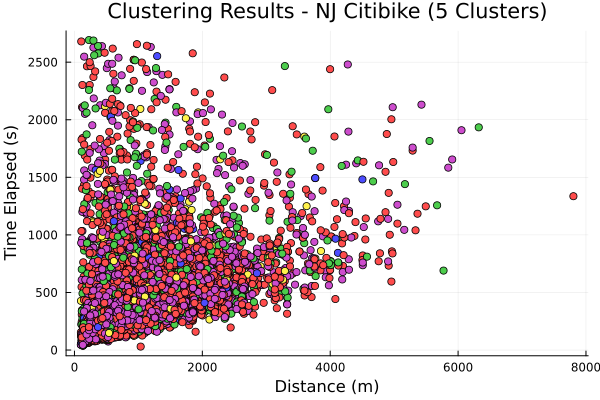

In [8]:
plot(dfs.distance_m, dfs.time_elapsed_s, seriestype=:scatter, marker_z=km.assignments,
        color=:lightrainbow, legend=false)
xlabel!("Distance (m)")
ylabel!("Time Elapsed (s)")
title!("Clustering Results - NJ Citibike (5 Clusters)")

Observe a somewhat positive and linear relationship between distance and time - that's logical; more distance requires more time. However, not exactly linear because rides may not be direct (stops along the way). Hard to see if we can cluster/classify much at all from this.

Perhaps the distance/time relationship is more linear for members?

In [9]:
# counts of member vs casual
combine(groupby(df, :member_casual), nrow => :count)

Row,member_casual,count
,String7,Int64
1,member,1481272
2,casual,498635


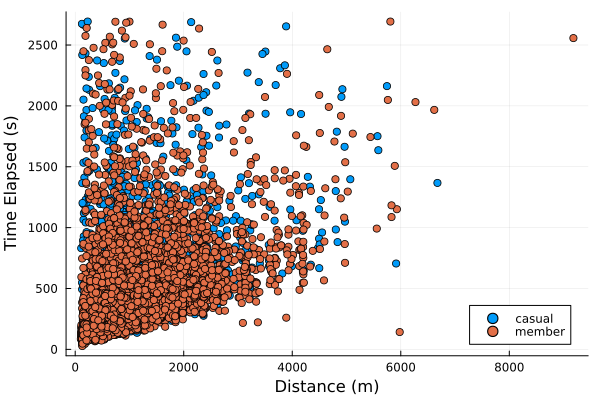

In [54]:
# subset
idx = rand(1:nrow(df_nonzero), 10000)
df_member = df_nonzero[idx, :]

plot()
for mem_type in ["casual", "member"]
    scatter!(df_member[df_member.member_casual .== mem_type, :].distance_m, 
            df_member[df_member.member_casual .== mem_type, :].time_elapsed_s, 
            label=mem_type)
end

xlabel!("Distance (m)")
ylabel!("Time Elapsed (s)")
current()


Hard to pickup a stronger distance vs time elapsed relationship.

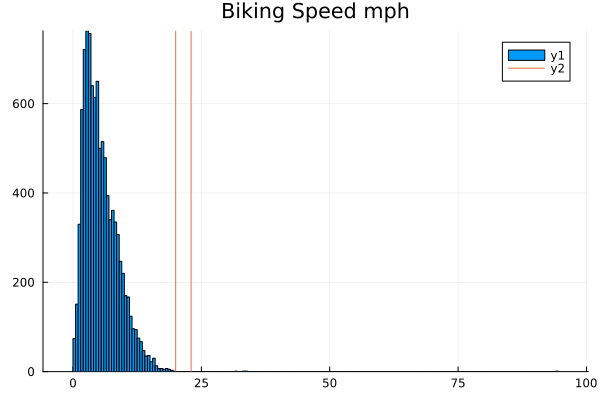

In [62]:
# calculate speed and plot to see if we can throw out outliers
histogram(df_member.distance_m ./ df_member.time_elapsed_s .* (3600 / 1609), title = "Biking Speed mph")
vline!([20, 23])

throw out > 20 mph rides for tractability. probably some uber fast delivery drivers or very short rides. There is possibly a left tail to exclude as well: under 1-2 mph could be accidental pickup.

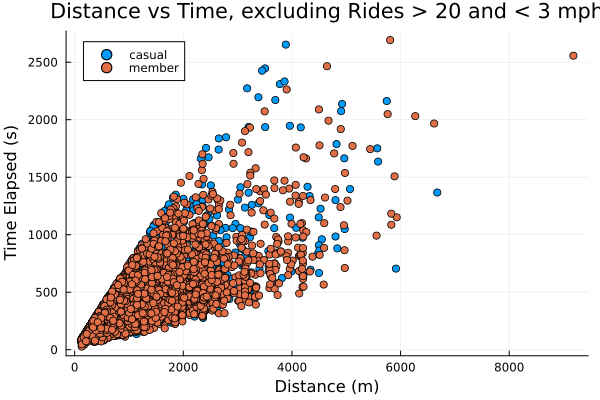

In [66]:
plot()

df_member = df_member[df_member.distance_m ./ df_member.time_elapsed_s .* (3600 / 1609) .< 20, :]
df_member = df_member[df_member.distance_m ./ df_member.time_elapsed_s .* (3600 / 1609) .> 3, :]
for mem_type in ["casual", "member"]
    scatter!(df_member[df_member.member_casual .== mem_type, :].distance_m, 
            df_member[df_member.member_casual .== mem_type, :].time_elapsed_s, 
            label=mem_type)
end

xlabel!("Distance (m)")
ylabel!("Time Elapsed (s)")
title!("Distance vs Time, excluding Rides > 20 and < 3 mph")
current()


Tough to cluster out much of anything from the above. Maybe we can cluster routes.

Idea: calculate similarity between routes.

Given two routes (two PAIRS of latitude/longitude), calculate a similarity score between the two routes as the sum of the squared haversine distance between pairs of start/end points in one direction and reversed. Idea 2: a route is more similar if the start/end is close to the reverse of the start/end of the second route than if both directions are very different. Let subscripts 1 and 2 represent the first route and 3 and represent the second route.
```math

s = haversine((x_1, y_1), (x_3, y_3))^2 + haversine((x_2, y_2), (x_4, y_4))^2 \\\\ + haversine((x_1, y_1), (x_4, y_4))^2 + haversine((x_2, y_2), (x_3, y_3))^2

```

In [180]:
routes = unique(df[:, [:start_station_name, :end_station_name, :start_lat, :start_lng, :end_lat, :end_lng]])

# no round trips
routes = routes[routes.start_station_name .!= routes.end_station_name, :]

Row,start_station_name,end_station_name,start_lat,start_lng,end_lat,end_lng
,String,String,Float64,Float64,Float64,Float64
1,Hoboken Terminal - Hudson St & Hudson Pl,Hamilton Park,40.7359,-74.0303,40.7276,-74.0442
2,Hoboken Terminal - Hudson St & Hudson Pl,Southwest Park - Jackson St & Observer Hwy,40.7359,-74.0303,40.7376,-74.0417
3,Hoboken Terminal - Hudson St & Hudson Pl,Marshall St & 2 St,40.7359,-74.0304,40.7408,-74.0425
4,Hoboken Terminal - Hudson St & Hudson Pl,Hamilton Park,40.736,-74.0304,40.7276,-74.0442
5,Hamilton Park,Manila & 1st,40.7276,-74.0442,40.7217,-74.0429
6,Hamilton Park,Marshall St & 2 St,40.7276,-74.0442,40.7408,-74.0425
7,Hoboken Terminal - Hudson St & Hudson Pl,Marin Light Rail,40.7359,-74.0303,40.7146,-74.0428
8,Journal Square,Christ Hospital,40.7337,-74.0625,40.7348,-74.0504
9,Journal Square,Christ Hospital,40.7338,-74.0625,40.7348,-74.0504


In [182]:
# you can observe that the lat/lng pairs are not unique per station...
# calculate mean lat/lng per start/end =>
routes = combine(groupby(routes, [:start_station_name, :end_station_name]), [:start_lat, :start_lng, :end_lat, :end_lng] .=> mean, renamecols=false)
routes_arr = Array(routes[:, [:start_lat, :start_lng, :end_lat, :end_lng]])

9161×4 Matrix{Float64}:
 40.7359  -74.0304  40.7276  -74.0442
 40.7359  -74.0304  40.7376  -74.0417
 40.7359  -74.0305  40.7408  -74.0425
 40.7275  -74.0443  40.7217  -74.0429
 40.7274  -74.0443  40.7408  -74.0425
 40.7359  -74.0304  40.7146  -74.0428
 40.7337  -74.0625  40.7348  -74.0504
 40.7153  -74.0378  40.7276  -74.0442
 40.7387  -74.039   40.7276  -74.0442
 40.7275  -74.0442  40.7185  -74.0477
  ⋮                          
 40.7164  -74.0343  40.7521  -73.9895
 40.7221  -74.0715  40.7768  -73.959
 40.746   -74.0282  40.7514  -74.0052
 40.7164  -74.0343  40.7091  -74.0104
 40.7177  -74.0438  40.7469  -74.0045
 40.7221  -74.0715  40.7149  -74.0112
 40.7135  -74.0629  40.7125  -74.0111
 40.7237  -74.0642  40.6867  -73.9906
 40.75    -74.0272  40.767   -73.9817

In [183]:
function route_similarity(r::AbstractArray)
    n = size(r)[1]
    dist = Array(zeros(n, n))
    for i = 1:size(r, 1)
        for j = 1:size(r, 1)
            dist[i, j] = haversine((r[i, 1], r[i, 2]), (r[j, 1], r[j, 2]))^2 + haversine((r[i, 3], r[i, 4]), (r[j, 3], r[j, 4]))^2 + haversine((r[i, 1], r[i, 2]), (r[j, 3], r[j, 4]))^2 + haversine((r[i, 3], r[i, 4]), (r[j, 1], r[j, 2]))^2
        end
    end
    return dist
end

route_similarity (generic function with 1 method)

In [198]:
routesim = route_similarity(routes_arr[1:25, :]) # 100 routes to be tractable

25×25 Matrix{Float64}:
 4.86793e6  4.19031e6  4.44655e6  …  4.74677e6  4.93217e6  3.90726e6
 4.19031e6  3.15753e6  3.41599e6     5.19548e6  5.45324e6  3.93235e6
 4.44655e6  3.41599e6  3.63224e6     5.24995e6  5.54387e6  4.24674e6
 4.61815e6  5.01628e6  5.0607e6      1.38297e5  2.82562e5  1.83292e6
 4.48934e6  4.50863e6  4.44687e6     7.0992e5   1.02555e6  2.61455e6
 4.96033e6  4.42976e6  4.79876e6  …  4.89753e6  4.95433e6  3.54022e6
 2.23565e7  2.40584e7  2.3374e7      1.04143e7  1.09184e7  1.80595e7
 4.16415e6  4.34888e6  4.55317e6     1.09304e6  1.14319e6  1.56619e6
 3.81139e6  3.63585e6  3.67049e6     1.08928e6  1.362e6    2.18103e6
 6.63558e6  7.39972e6  7.35014e6     5.71548e5  7.20841e5  3.26207e6
 ⋮                                ⋱                        
 3.77327e6  3.01595e6  2.97461e6     2.5288e6   2.98912e6  3.41205e6
 3.18005e6  3.08866e6  3.47986e6     1.83957e6  1.78525e6  8.53975e5
 3.64759e6  3.02319e6  3.51332e6     4.43889e6  4.41019e6  2.23448e6
 6.1646e7   6.56279e

In [199]:
# use hierarchical clustering to find the similarities between routes
route_clust = hclust(routesim, linkage = :average, uplo = :U)

Hclust{Float64}([-4 -23; -24 1; … ; 21 22; -20 23], [138297.20898021676, 280944.78304661135, 622562.8773341506, 668114.7098674625, 709129.8924333436, 823178.1550995727, 1.068304047649313e6, 1.124112555739461e6, 1.2562447311509259e6, 1.8068474310308392e6  …  3.2994356040038597e6, 3.759735308755276e6, 3.973481958650635e6, 4.265272858522479e6, 4.3680949359318055e6, 4.589024135541269e6, 4.706130480607876e6, 6.63847893897595e6, 1.749014389694746e7, 5.241888188061679e7], [20, 17, 10, 24, 4, 23, 5, 9, 8, 25  …  6, 21, 14, 3, 2, 19, 12, 15, 7, 16], :average)

In [200]:
include("./hclustrecipe.jl")

treepositions (generic function with 1 method)

In [201]:
clust_ = hclustplot(route_clust, true)
clust_ = (convert(Array{Float64}, clust_[1]), convert(Array{Float64}, clust_[2]))


(Any[5 4.0 … 9.9521484375 1.0; 5 4.0 … 9.9521484375 1.0; 6 5.5 … 24.5 17.22607421875; 6 5.5 … 24.5 17.22607421875], Any[0.0 0.0 … 3.591619122061283e7 0.0; 138297.20898021676 419241.9920268281 … 5.340633511756029e7 1.0582521699817708e8; 138297.20898021676 419241.9920268281 … 5.340633511756029e7 1.0582521699817708e8; 0.0 138297.20898021676 … 6.63847893897595e6 5.340633511756029e7])

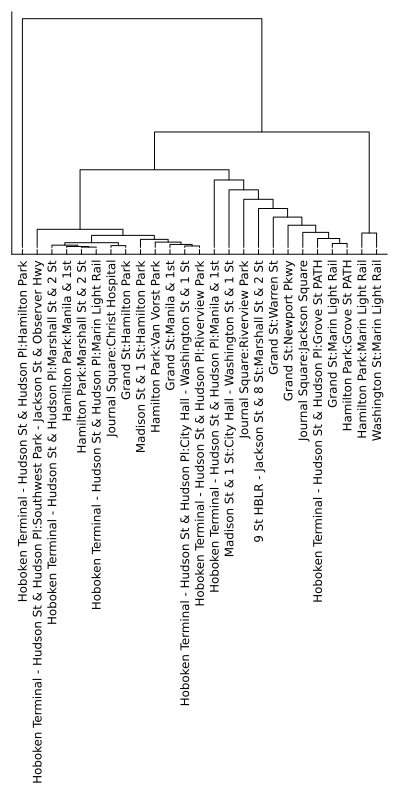

In [212]:
plot(clust_, seriestype=:path, color=:black, yaxis=nothing, 
    grid=false, 
    legend=false, 
    xticks = (1:25, string.(routes[1:25, :].start_station_name, ":", 
        routes[1:25, :].end_station_name)),
    xrotation=90,
    size=(400, 800))

above seems to make sense to me on a once over. if you share a start/end then you are more likely to be clustered together